In [1]:
import contextily as ctx
import geopandas as gpd
import geoplot
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import urbanpy as up
import warnings
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import colorbar

In [2]:
warnings.filterwarnings('ignore')

## Cargar datos

### Restaurantes en Surquilo

<AxesSubplot:>

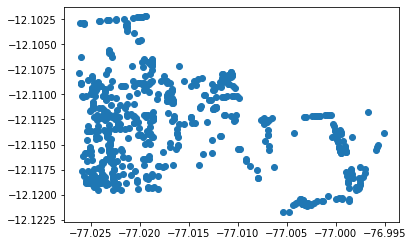

In [3]:
restaurants = gpd.read_file('inputs/SHP_CAPAS_COMERCIOS_ENTREGA/SHP_RESTAURANTE/SHP_RESTAURANTES_SURQUILLO.shp')
restaurants = restaurants.to_crs('EPSG:4326')
restaurants.plot()

### Panaderias en Surquillo

<AxesSubplot:>

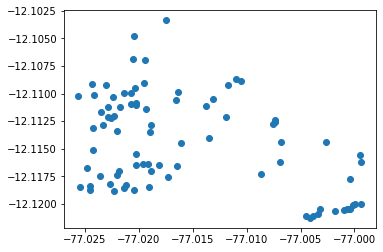

In [4]:
panaderias = gpd.read_file('inputs/SHP_CAPAS_COMERCIOS_ENTREGA/SHP_PANADERIA/SHP_PANADERIAS_SURQUILLO.shp')
panaderias = panaderias.to_crs('EPSG:4326')
panaderias.plot()

### Bodegas en Surquillo

In [5]:
bodegas = pd.read_csv('inputs/bodegas-surquillo.csv')

In [6]:
bodegas_gdf = gpd.GeoDataFrame(
    bodegas,
    geometry=gpd.points_from_xy(bodegas['Position X'], bodegas['Position Y']),
    crs='EPSG:32718')

### Comedores en Surquillo

In [7]:
comedores = pd.read_csv('inputs/datos_modificados/Comedores.csv')

In [8]:
comedores_gdf = gpd.GeoDataFrame(
    comedores,
    geometry=gpd.points_from_xy(comedores['LONGITUD'], comedores['LATITUD']),
    crs='EPSG:4326')

### Ferias en Surquillo

In [9]:
ferias = pd.read_csv('inputs/datos_modificados/Ferias.csv')

In [10]:
ferias_gdf = gpd.GeoDataFrame(
    ferias,
    geometry=gpd.points_from_xy(ferias['Longitud'], ferias['Latitud']),
    crs='EPSG:4326')

### Limites distritales

In [11]:
surquillo = up.download.nominatim_osm('surquillo')
surquillo.crs = 'EPSG:4326'

<AxesSubplot:>

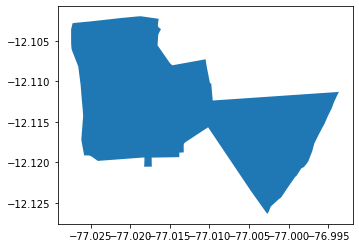

In [12]:
surquillo.plot()

### Mercados

In [13]:
mercados = pd.read_csv('inputs/database_mercadosINEI.csv')

mercados_lat_correct = mercados.latitude[mercados.latitude < -12.485] / 1e+6
mercados.latitude[mercados.latitude < -12.485] = mercados_lat_correct

mercados_long_correct = mercados.longitude[mercados.longitude < -77.175] / 1e+6
mercados.longitude[mercados.longitude < -77.175] = mercados_long_correct

In [14]:
mercados_geometry = gpd.points_from_xy(mercados.longitude, mercados.latitude, crs='EPSG:4326')

In [15]:
mercados_gdf = gpd.GeoDataFrame(mercados, geometry=mercados_geometry)

In [16]:
# Filter markets in surquillo
mercados_gdf = mercados_gdf[mercados_gdf.within(surquillo.geometry[0])]

<AxesSubplot:>

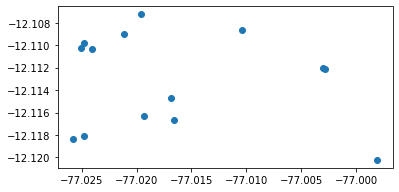

In [17]:
mercados_gdf.plot()

### Poblacion Estimada Facebook HDX

In [18]:
lima = up.download.nominatim_osm('Lima, Peru', 2) # third result
callao = up.download.nominatim_osm('Callao, Peru', 1)
lima = up.geom.merge_geom_downloads([lima, callao])

In [19]:
pop_per = up.download.hdx_fb_population('peru', 'full')
pop_lima = up.geom.filter_population(pop_per, lima)
pop_lima = up.geom.remove_features(pop_lima, [-77.3, -12.2, -77.17, -12])

In [20]:
hex_lima = up.geom.gen_hexagons(8, lima)
hex_lima = up.geom.merge_shape_hex(hex_lima, pop_lima, agg={'population_2020':'sum'})
hex_lima = hex_lima.rename(columns={'population_2020':'population'})

In [21]:
hex_lima.head()

,hex,geometry,population
0,888e620e41fffff,"POLYGON ((-76.80007 -12.46917, -76.80439 -12.4...",428.579392
1,888e62c855fffff,"POLYGON ((-77.21623 -12.08574, -77.22056 -12.0...",NaN
2,888e62c843fffff,"POLYGON ((-77.22156 -12.07839, -77.22589 -12.0...",NaN
3,888e62c80bfffff,"POLYGON ((-77.22006 -12.09398, -77.22438 -12.0...",NaN
4,888e62c84dfffff,"POLYGON ((-77.23222 -12.06370, -77.23655 -12.0...",NaN


### Poblacion Flotante Landscan

In [22]:
lima_pop_float = pd.read_csv('inputs/lima_pop_landscan.csv')

In [23]:
points = gpd.points_from_xy(lima_pop_float.lon, lima_pop_float.lat)
circles = points.buffer(0.0045)
quadrants = circles.envelope

In [24]:
float_gdf = gpd.GeoDataFrame(
    lima_pop_float,
    geometry=quadrants,
    crs='EPSG:4326'
)

### Censo INEI 2017

In [25]:
manzanas = gpd.read_file('inputs/Manzanas/mz_lima_region.shp')

In [26]:
manzanas['NSE16'] = manzanas['NSE16'].replace('-7', np.nan)
manzanas['NSE16'] = manzanas['NSE16'].replace({
    'AL':'Alto', 
    'MA':'Medio Alto', 
    'ME':'Medio', 
    'MB':'Medio Bajo', 
    'BA':'Bajo'})

In [27]:
# Filter blocks in surquillo
minx, miny, maxx, maxy = surquillo.total_bounds
padding = 0.0005
manzanas = manzanas.cx[minx-padding:maxx+padding, miny-padding:maxy+padding]

<AxesSubplot:>

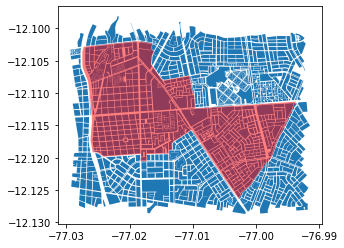

In [28]:
ax = manzanas.plot()
surquillo.plot(ax=ax, color='red', alpha=0.5)

## Crear los mapas

## Parametros globales para los mapas

In [29]:
BASEMAP_SRC = ctx.providers.CartoDB.Positron

## Colores de referencia

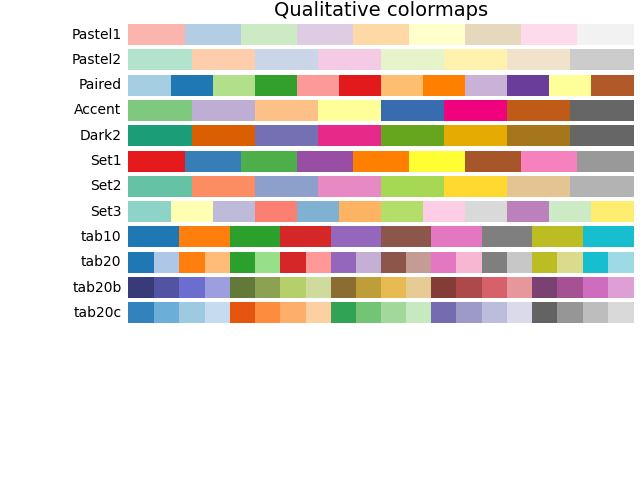

### Colores 
- Mercados: 'Lila (2do morado)'
- Restaurantes: 'Azul'
- Comedores: 'Gris'
- Bodegas: 'Naranja'
- Panaderias: 'Marron'
- Ferias: 'Celeste'

In [30]:
cmap_colors = colorbar.cm.tab20.colors

In [31]:
colors = {
    'restaurantes': cmap_colors[0],
    'mercados': cmap_colors[2],
    'comedores': cmap_colors[4],
    'bodegas': cmap_colors[6],
    'panaderias': cmap_colors[8],
    'ferias': cmap_colors[10]
}        

## Datos proyectados a epsg=3857 para definir los mapas

In [32]:
# Puntos de Interes
restaurants_proj = restaurants.to_crs('EPSG:3857')
mercados_gdf_proj = mercados_gdf.to_crs('EPSG:3857')
bodegas_gdf_proj = bodegas_gdf.to_crs('EPSG:3857')
panaderias_proj = panaderias.to_crs('EPSG:3857')
comedores_gdf_proj = comedores_gdf.to_crs('EPSG:3857')
ferias_gdf_proj = ferias_gdf.to_crs('EPSG:3857')
# Limites distritales
surquillo_proj = surquillo.to_crs('EPSG:3857')
manzanas_proj = manzanas.to_crs('EPSG:3857')
# Fondos - mapas de calor
pop_overlay_web = float_gdf.to_crs('EPSG:3857')
pop_est_overlay_web = hex_lima.to_crs('EPSG:3857')

### Mapa de calor de restaurantes

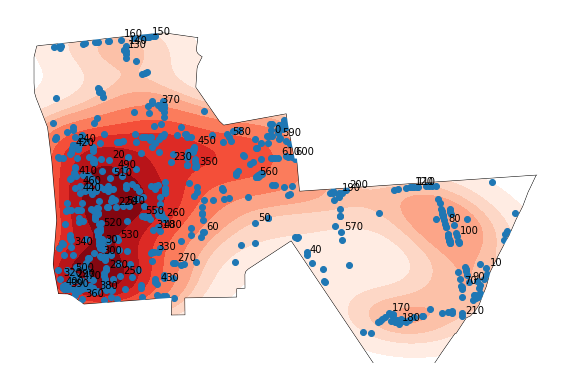

In [33]:
ax = geoplot.kdeplot(
    df=restaurants, clip=surquillo.geometry,
    shade=True, cmap='Reds')
surquillo.plot(ax=ax, facecolor="none", edgecolor='k')
restaurants.plot(ax=ax)

for x, y, label in zip(restaurants.geometry.x, restaurants.geometry.y, restaurants.index):
    if label % 10 == 0:
        ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points")

plt.tight_layout()

### Restaurantes (heatmap) + Caminabilidad restaurantes

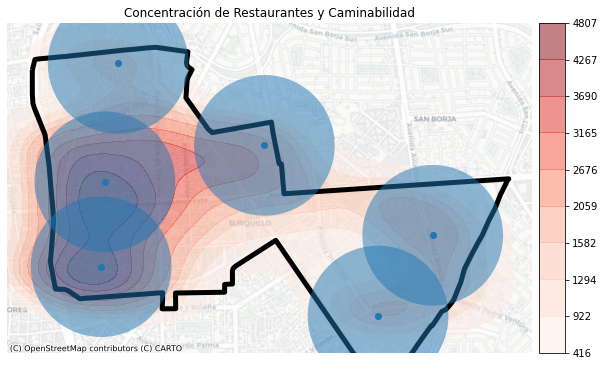

In [79]:
centroids = restaurants.loc[[130, 510, 280, 590, 100, 180],:]

fig, ax = plt.subplots(1, 1, figsize=(10,10))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
geoplot.kdeplot(restaurants, ax=ax, cbar=True,
    shade=True, cmap='Reds', alpha=0.5, shade_lowest=False, cbar_ax=cax)
surquillo.plot(ax=ax, facecolor="none", edgecolor='k', linewidth=5)

centroids.buffer(0.005).plot(ax=ax, alpha=0.5)
centroids.plot(ax=ax)

ax.set_title('Concentración de Restaurantes y Caminabilidad')

ctx.add_basemap(ax, source=BASEMAP_SRC, crs='EPSG:4326')
ax.set_axis_off()

plt.savefig('outputs/maps/combinaciones/restaurants-heatmap-buffer.png', dpi=300, bbox_inches='tight')

### Helper function to generate maps

In [36]:
def gen_map(main_gdf, label='', fn=None, pop_overlay=None, overlay_col='population', create_buffers=False, buffers_color='b', buffer_centers=None, clip=None, return_ax=False, **kwargs):
    ax = main_gdf.plot(figsize=(10,10), zorder=3, label=label, **kwargs)
    
    if pop_overlay is not None:
        pop_overlay.plot(ax=ax, column=overlay_col, cmap='Reds', 
                         edgecolor='none', alpha=0.5, zorder=1)
    
    if create_buffers:
        if buffer_centers is None:
            centers = main_gdf
        else:
            centers = main_gdf.loc[buffer_centers,:]
        buffers = centers.buffer(500) # radio de 500 metros
        buffers.plot(ax=ax, alpha=0.4, zorder=2, color=buffers_color)
    
            
    if clip is not None:
        border = 100
        clip.plot(ax=ax, facecolor='none', edgecolor='k',
                  linewidth=5, zorder=1)
        minx, miny, maxx, maxy = clip.total_bounds
        ax.set_xlim(minx - border, maxx + border)
        ax.set_ylim(miny - border, maxy + border)
        
    ctx.add_basemap(ax, source=BASEMAP_SRC)
    ax.set_axis_off()
    
    plt.legend()
            
    if fn is not None:
        plt.savefig(f'outputs/maps/{fn}.png', dpi=300, bbox_inches='tight')
    
    if return_ax:
        return ax
    else:    
        plt.show()

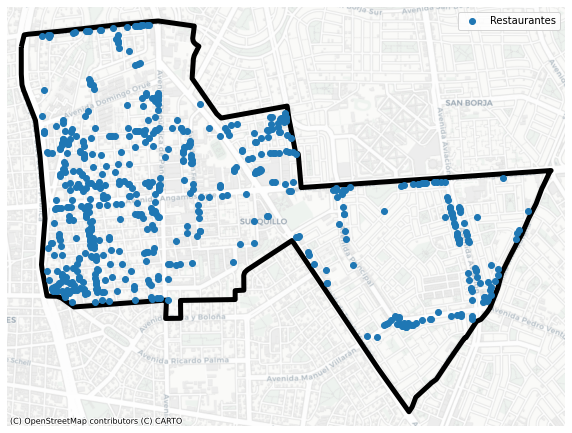

In [37]:
# Try gen_map function
gen_map(restaurants_proj, 'Restaurantes', fn='mercados', clip=surquillo_proj)

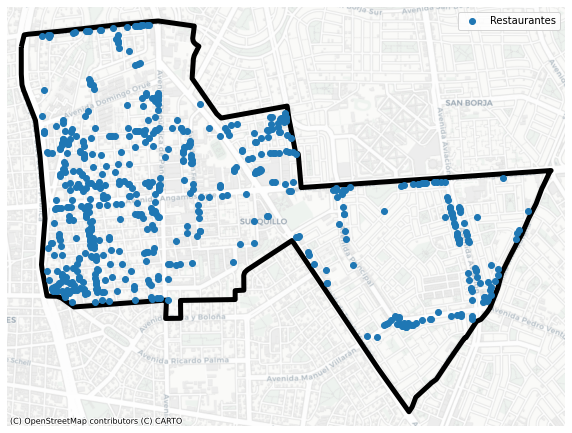

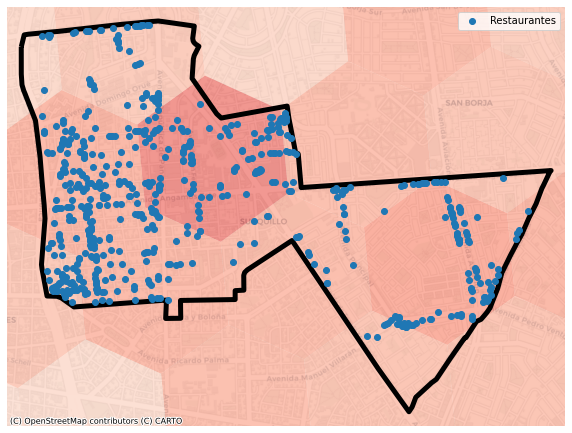

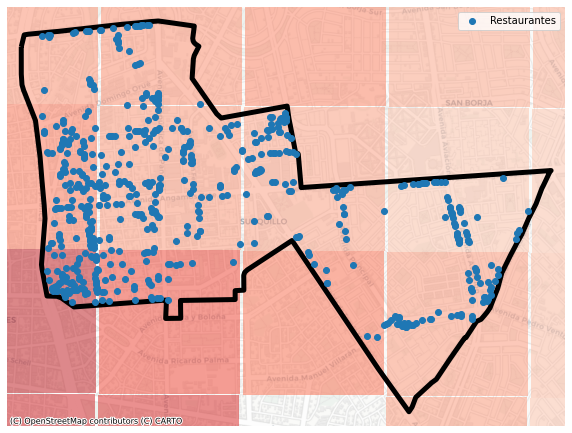

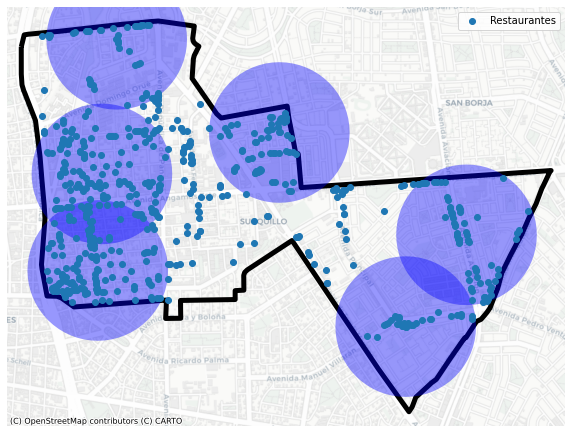

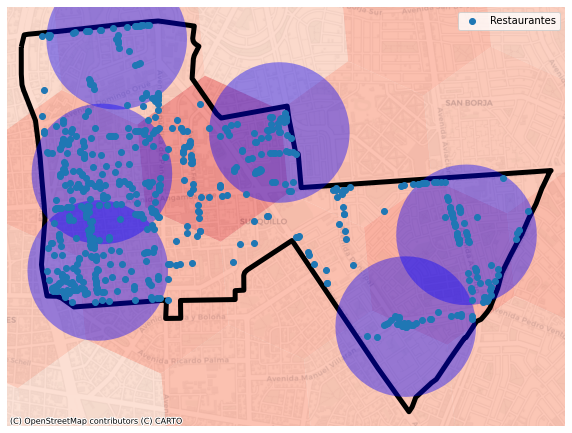

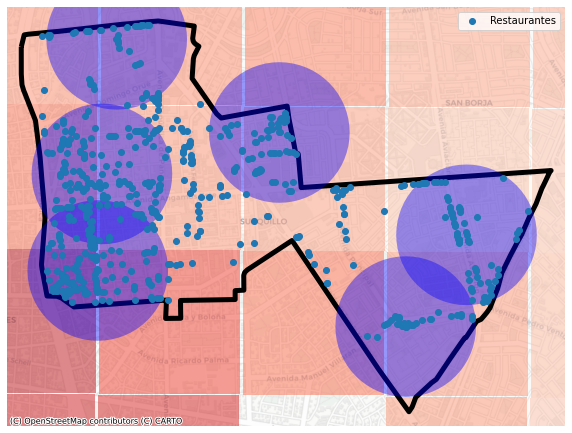

In [38]:
# 1. Restaurantes (puntos)
gen_map(restaurants_proj, 'Restaurantes', fn='restaurantes', clip=surquillo_proj)
# 2. Restaurantes (puntos) + Pob. Estimada
gen_map(restaurants_proj, 'Restaurantes', fn='restaurantes_pob_est', clip=surquillo_proj,
        pop_overlay=pop_est_overlay_web)
# 3. Restaurantes (puntos) + Pob. Flotante
gen_map(restaurants_proj, 'Restaurantes', fn='restaurantes_pob_flot', clip=surquillo_proj,
        pop_overlay=pop_overlay_web)
# 4. Restaurantes (puntos) + Entorno
gen_map(restaurants_proj, 'Restaurantes', fn='restaurantes_entorno', clip=surquillo_proj, 
        create_buffers=True, buffer_centers=[130, 510, 280, 590, 100, 180])
# 5. Restaurantes (puntos) + Entorno + Pob. Estimada
gen_map(restaurants_proj, 'Restaurantes', fn='restaurantes_entorno_pob_est', clip=surquillo_proj,
        pop_overlay=pop_est_overlay_web,  create_buffers=True, 
        buffer_centers=[130, 510, 280, 590, 100, 180])
# 6. Restaurantes (puntos) + Entorno + Pob. Flotante
gen_map(restaurants_proj, 'Restaurantes', fn='restaurantes_entorno_pob_flot', clip=surquillo_proj, 
        pop_overlay=pop_overlay_web, create_buffers=True, 
        buffer_centers=[130, 510, 280, 590, 100, 180])

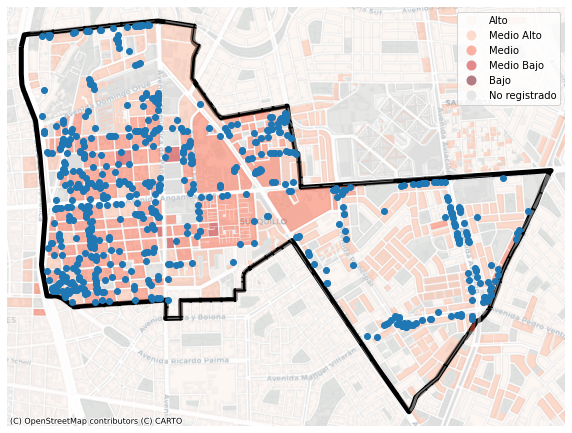

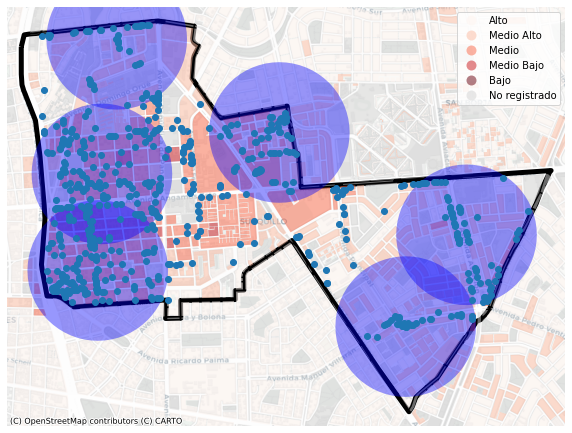

In [39]:
# 7. Restaurantes (puntos) + NSE Censo 2017
ax = gen_map(restaurants_proj, 'Restaurantes', clip=surquillo_proj, return_ax=True)
manzanas_proj.plot(column='NSE16', alpha=0.5, cmap='Reds', 
                   legend=True, ax=ax,
                   missing_kwds={'color': 'lightgrey', 
                                 'label': 'No registrado'},
                   categories=['Alto', 'Medio Alto', 'Medio',
                               'Medio Bajo', 'Bajo'])
plt.savefig(f'outputs/maps/restaurantes_nse.png', dpi=300, bbox_inches='tight')
# 8. Restaurantes (puntos) + Entorno + NSE Censo 2017
ax = gen_map(restaurants_proj, 'Restaurantes', clip=surquillo_proj,
             create_buffers=True, buffer_centers=[130, 510, 280, 590, 100, 180], 
             return_ax=True)
manzanas_proj.plot(column='NSE16', alpha=0.5, cmap='Reds', 
                   legend=True, ax=ax,
                   missing_kwds={'color': 'lightgrey', 
                                 'label': 'No registrado'},
                   categories=['Alto', 'Medio Alto', 'Medio',
                               'Medio Bajo', 'Bajo'])
plt.savefig(f'outputs/maps/restaurantes_entorno_nse.png', dpi=300, bbox_inches='tight')

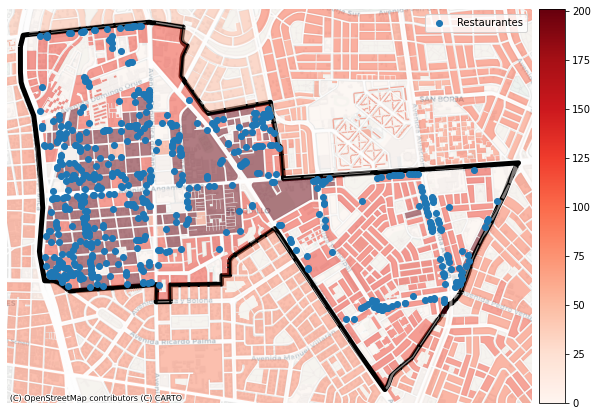

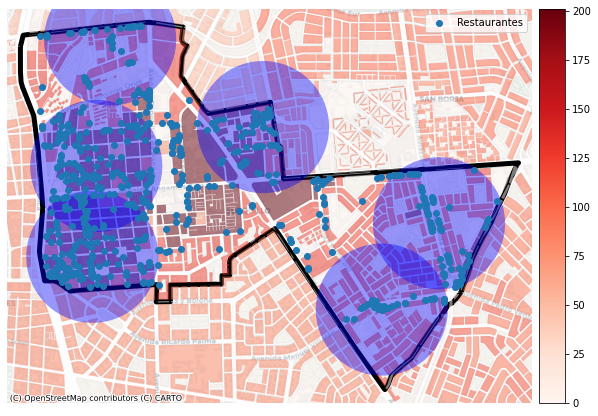

In [40]:
# 9. Restaurantes (puntos) + Densidad Pob Censo 2017
ax = gen_map(restaurants_proj, 'Restaurantes', clip=surquillo_proj, return_ax=True)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

manzanas_proj.plot(column='POB16', alpha=0.5, cmap='Reds', 
                   legend=True, cax=cax, ax=ax,
                   missing_kwds={'color': 'lightgrey', 
                                 'label': 'No registrado'})
plt.savefig('outputs/maps/restaurantes_pob16.png', dpi=300, bbox_inches='tight')
# 10. Restaurantes (puntos) + Entorno + NSE Censo 2017
ax = gen_map(restaurants_proj, 'Restaurantes', clip=surquillo_proj,
             create_buffers=True, buffer_centers=[130, 510, 280, 590, 100, 180], 
             return_ax=True)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

manzanas_proj.plot(column='POB16', alpha=0.5, cmap='Reds', 
                   legend=True, cax=cax, ax=ax,
                   missing_kwds={'color': 'lightgrey', 
                                 'label': 'No registrado'})
plt.savefig('outputs/maps/restaurantes_entorno_pob16.png', dpi=300, bbox_inches='tight')

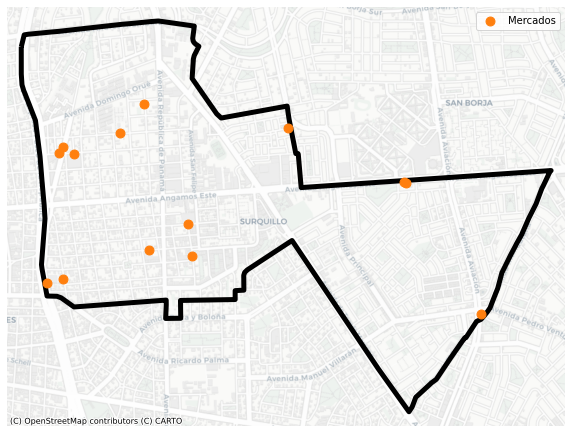

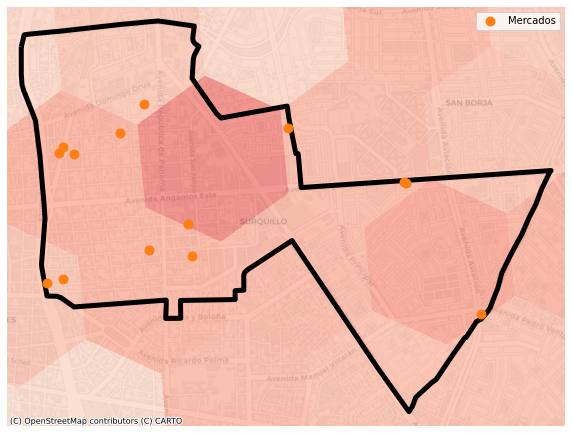

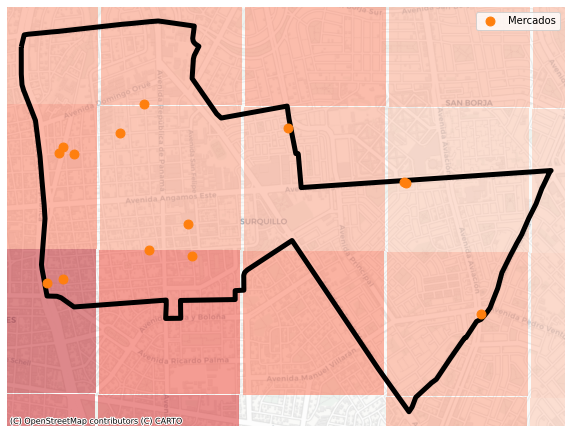

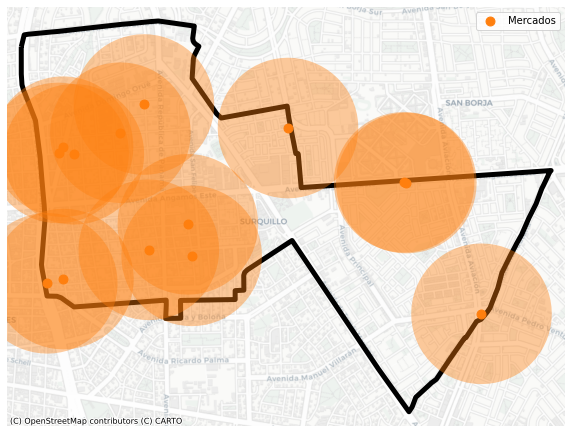

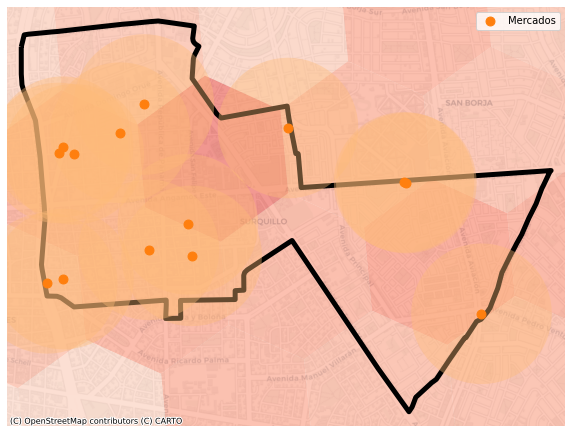

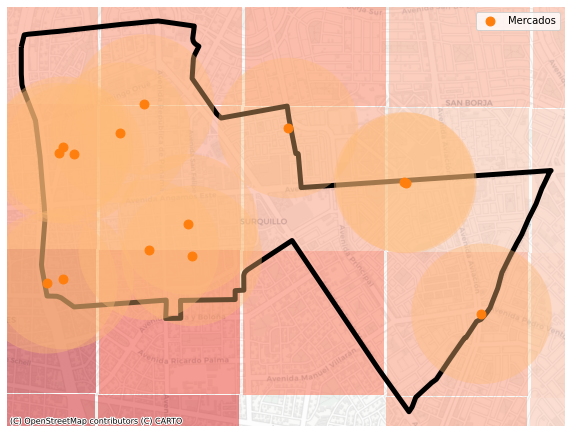

In [41]:
# 1. Mercados (puntos)
gen_map(mercados_gdf_proj, label='Mercados', fn='Mercados', clip=surquillo_proj, 
        color=colors['mercados'], markersize=80)
# 2. Mercados (puntos) + Pob. Estimada
gen_map(mercados_gdf_proj, label='Mercados', fn='Mercados_pob_est', clip=surquillo_proj, 
        pop_overlay=pop_est_overlay_web, color=colors['mercados'], 
        markersize=80)
# 3. Mercados (puntos) + Pob. Flotante
gen_map(mercados_gdf_proj, label='Mercados', fn='Mercados_pob_flot', clip=surquillo_proj,
        pop_overlay=pop_overlay_web, color=colors['mercados'],
        markersize=80)
# 4. Mercados (puntos) + Entorno
gen_map(mercados_gdf_proj, label='Mercados', fn='Mercados_entorno', clip=surquillo_proj,
        create_buffers=True, buffers_color=colors['mercados'],
        color=colors['mercados'], markersize=80)
# 5. Mercados (puntos) + Entorno + Pob. Estimada
gen_map(mercados_gdf_proj, label='Mercados', fn='Mercados_entorno_pob_est', clip=surquillo_proj,
        pop_overlay=pop_est_overlay_web, create_buffers=True,
        buffers_color=cmap_colors[3], color=colors['mercados'],
        markersize=80)
# 6. Mercados (puntos) + Entorno + Pob. Flotante
gen_map(mercados_gdf_proj, label='Mercados', fn='Mercados_entorno_pob_flot', clip=surquillo_proj,
        pop_overlay=pop_overlay_web, create_buffers=True,
        buffers_color=cmap_colors[3], color=colors['mercados'],
        markersize=80)

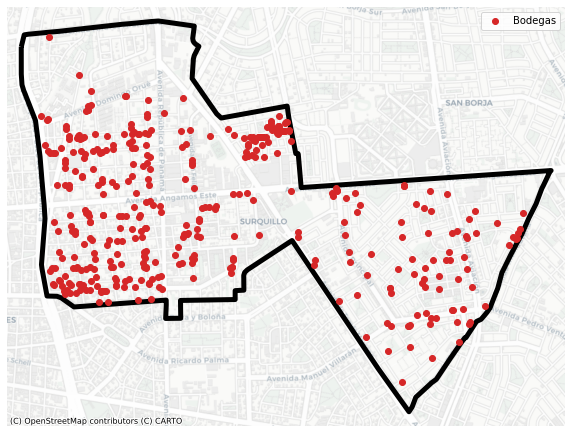

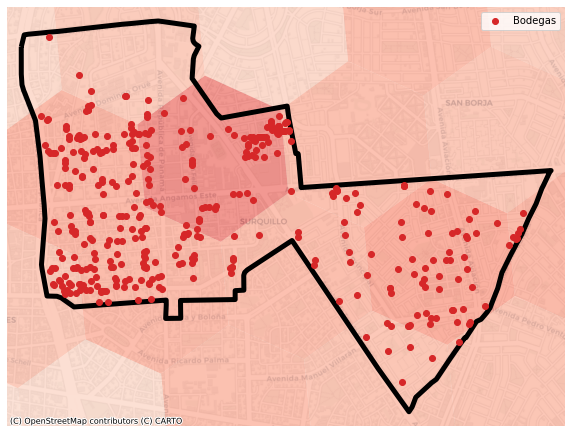

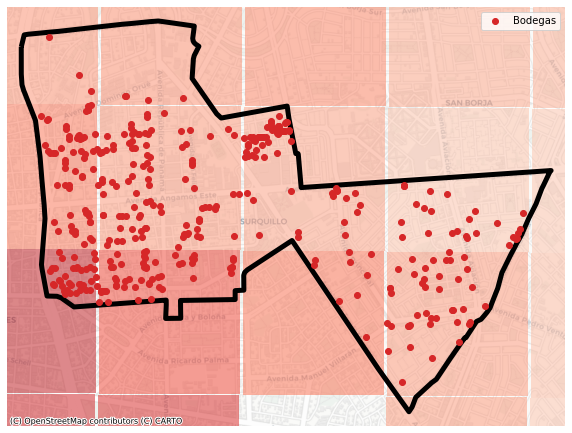

In [42]:
# 1. Bodegas (puntos)
gen_map(bodegas_gdf_proj, label='Bodegas', fn='Bodegas', clip=surquillo_proj,
        color=colors['bodegas'])
# 2. Bodegas (puntos) + Pob. Estimada
gen_map(bodegas_gdf_proj, label='Bodegas', fn='Bodegas_pob_est', clip=surquillo_proj,
        pop_overlay=pop_est_overlay_web,  color=colors['bodegas'])
# 3. Bodegas (puntos) + Pob. Flotante
gen_map(bodegas_gdf_proj, label='Bodegas', fn='Bodegas_pob_flot', clip=surquillo_proj,
        pop_overlay=pop_overlay_web, color=colors['bodegas'])

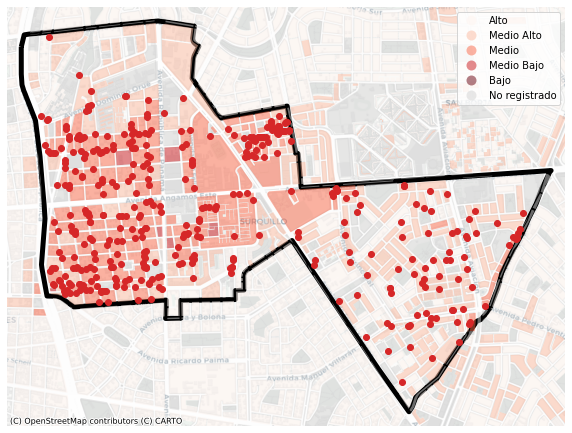

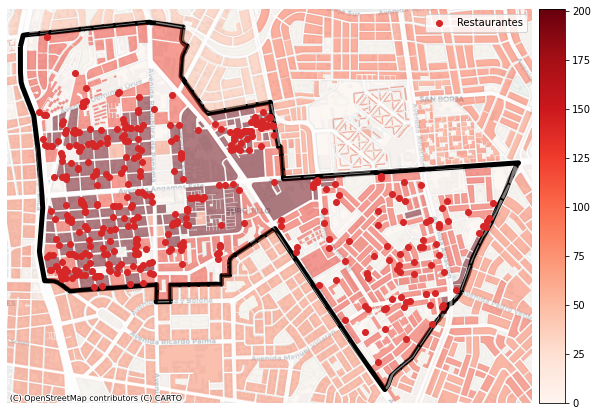

In [43]:
# 4. Bodegas (puntos) + NSE Censo 2017
ax = gen_map(bodegas_gdf_proj, 'Bodegas', clip=surquillo_proj, return_ax=True,
             color=colors['bodegas'])
manzanas_proj.plot(column='NSE16', alpha=0.5, cmap='Reds', 
                   legend=True, ax=ax,
                   missing_kwds={'color': 'lightgrey', 
                                 'label': 'No registrado'},
                   categories=['Alto', 'Medio Alto', 'Medio',
                               'Medio Bajo', 'Bajo'])
plt.savefig(f'outputs/maps/bodegas_nse.png', dpi=300, bbox_inches='tight')
# 5. Bodegas (puntos) + Densidad Pob Censo 2017
ax = gen_map(bodegas_gdf_proj, 'Restaurantes', clip=surquillo_proj, return_ax=True,
             color=colors['bodegas'])

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

manzanas_proj.plot(column='POB16', alpha=0.5, cmap='Reds', 
                   legend=True, cax=cax, ax=ax,
                   missing_kwds={'color': 'lightgrey', 
                                 'label': 'No registrado'})
plt.savefig('outputs/maps/bodegas_pob16.png', dpi=300, bbox_inches='tight')

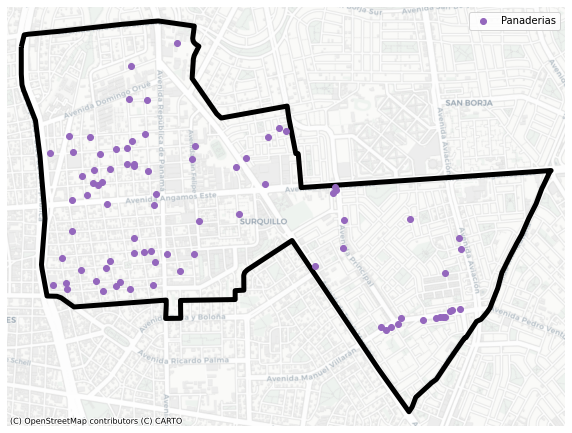

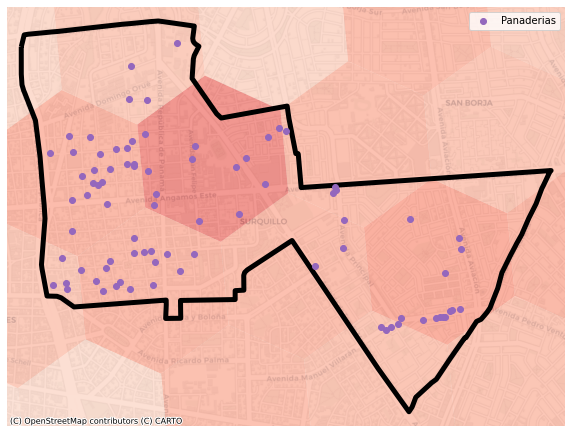

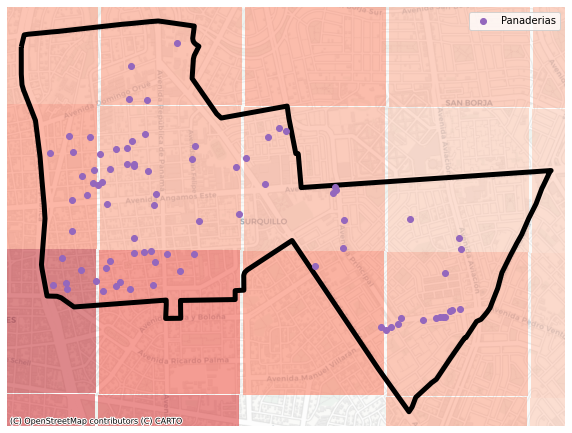

In [44]:
# 1. Panaderias (puntos)
gen_map(panaderias_proj, label='Panaderias', fn='Panaderias', clip=surquillo_proj,
        color=colors['panaderias'])
# 2. Panaderias (puntos) + Pob. Estimada
gen_map(panaderias_proj, label='Panaderias', fn='Panaderias_pob_est', clip=surquillo_proj,
        pop_overlay=pop_est_overlay_web,  color=colors['panaderias'])
# 3. Panaderias (puntos) + Pob. Flotante
gen_map(panaderias_proj, label='Panaderias', fn='Panaderias_pob_flot', clip=surquillo_proj,
        pop_overlay=pop_overlay_web, color=colors['panaderias'])

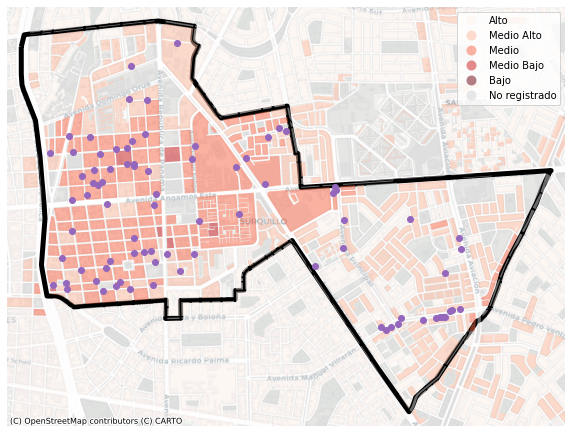

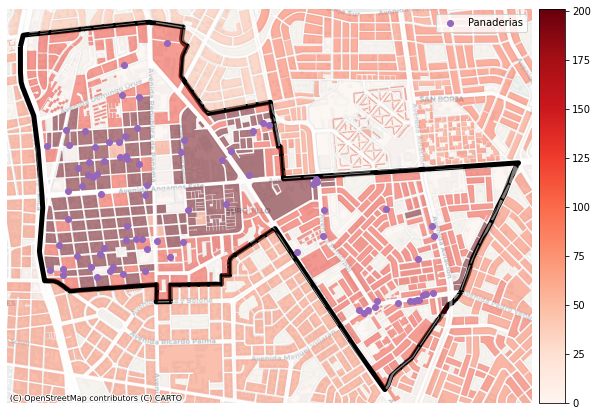

In [45]:
# 4. Panaderias (puntos) + NSE Censo 2017
ax = gen_map(panaderias_proj, 'Panaderias', clip=surquillo_proj, return_ax=True,
             color=colors['panaderias'])
manzanas_proj.plot(column='NSE16', alpha=0.5, cmap='Reds', 
                   legend=True, ax=ax,
                   missing_kwds={'color': 'lightgrey', 
                                 'label': 'No registrado'},
                   categories=['Alto', 'Medio Alto', 'Medio',
                               'Medio Bajo', 'Bajo'])
plt.savefig(f'outputs/maps/panaderias_nse.png', dpi=300, bbox_inches='tight')
# 5. Panaderias (puntos) + Densidad Pob Censo 2017
ax = gen_map(panaderias_proj, 'Panaderias', clip=surquillo_proj, return_ax=True,
             color=colors['panaderias'])

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

manzanas_proj.plot(column='POB16', alpha=0.5, cmap='Reds', 
                   legend=True, cax=cax, ax=ax,
                   missing_kwds={'color': 'lightgrey', 
                                 'label': 'No registrado'})
plt.savefig('outputs/maps/panaderias_pob16.png', dpi=300, bbox_inches='tight')

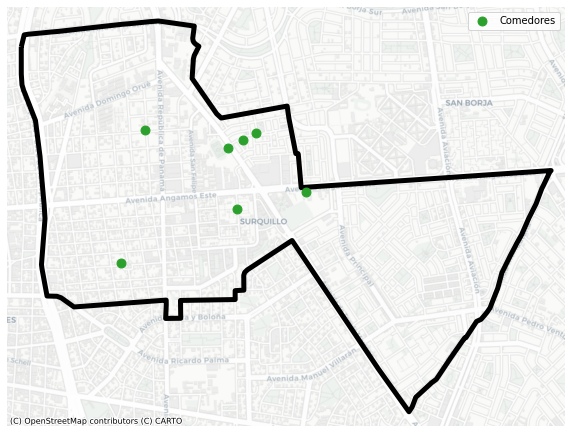

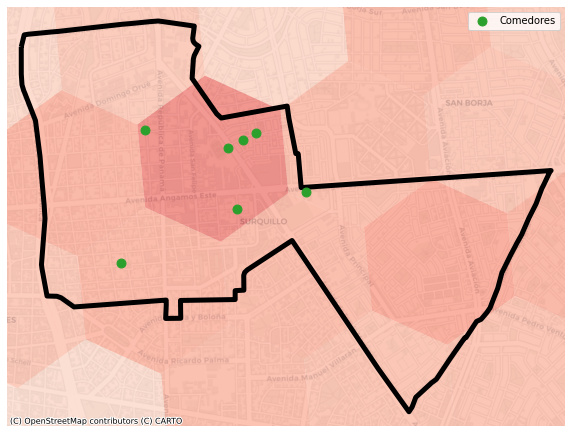

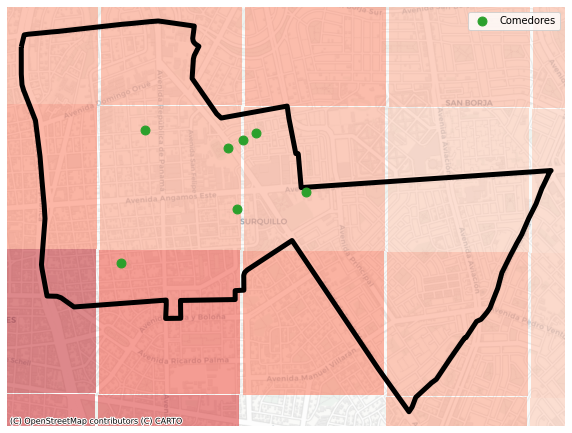

In [46]:
# 1. Comedores (puntos)
gen_map(comedores_gdf_proj, label='Comedores', fn='Comedores', clip=surquillo_proj,
        color=colors['comedores'], markersize=80)
# 2. Comedores (puntos) + Pob. Estimada
gen_map(comedores_gdf_proj, label='Comedores', fn='Comedores_pob_est', clip=surquillo_proj,
        pop_overlay=pop_est_overlay_web,  color=colors['comedores'], markersize=80)
# 3. Comedores (puntos) + Pob. Flotante
gen_map(comedores_gdf_proj, label='Comedores', fn='Comedores_pob_flot', clip=surquillo_proj,
        pop_overlay=pop_overlay_web, color=colors['comedores'], markersize=80)

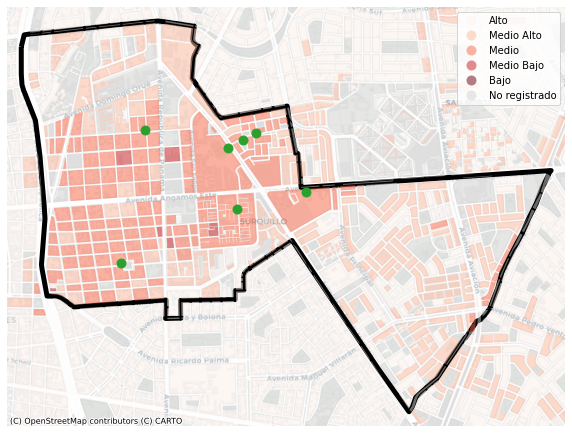

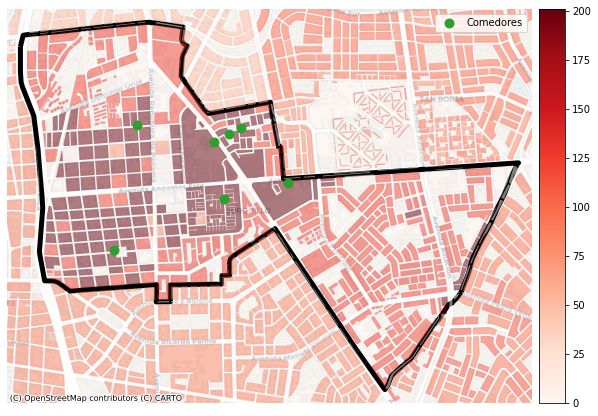

In [47]:
# 4. Comedores (puntos) + NSE Censo 2017
ax = gen_map(comedores_gdf_proj, 'Comedores', clip=surquillo_proj, return_ax=True,
             color=colors['comedores'], markersize=80)
manzanas_proj.plot(column='NSE16', alpha=0.5, cmap='Reds', 
                   legend=True, ax=ax,
                   missing_kwds={'color': 'lightgrey', 
                                 'label': 'No registrado'},
                   categories=['Alto', 'Medio Alto', 'Medio',
                               'Medio Bajo', 'Bajo'])
plt.savefig(f'outputs/maps/comedores_nse.png', dpi=300, bbox_inches='tight')
# 5. Comedores (puntos) + Densidad Pob Censo 2017
ax = gen_map(comedores_gdf_proj, 'Comedores', clip=surquillo_proj, return_ax=True,
             color=colors['comedores'], markersize=80)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

manzanas_proj.plot(column='POB16', alpha=0.5, cmap='Reds', 
                   legend=True, cax=cax, ax=ax,
                   missing_kwds={'color': 'lightgrey', 
                                 'label': 'No registrado'})
plt.savefig('outputs/maps/comedores_pob16.png', dpi=300, bbox_inches='tight')

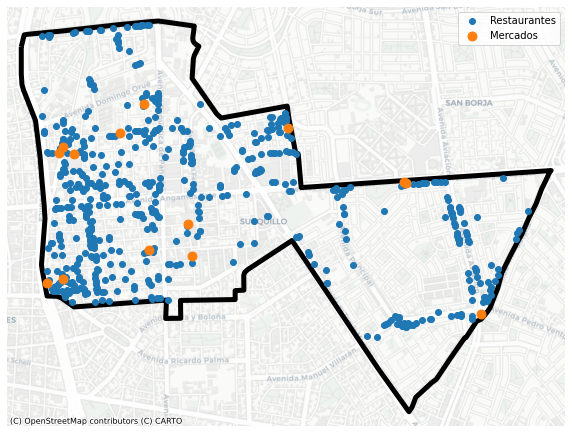

In [51]:
# 13. Mercados (puntos) + Restaurantes (puntos)
ax = gen_map(restaurants_proj, 'Restaurantes', color=colors['restaurantes'], clip=surquillo_proj, return_ax=True)
mercados_gdf_proj.plot(ax=ax, label='Mercados', color=colors['mercados'], markersize=80, zorder=3)
plt.legend()

plt.savefig(f'outputs/maps/restaurantes_mercados.png', dpi=300, bbox_inches='tight')
plt.show()

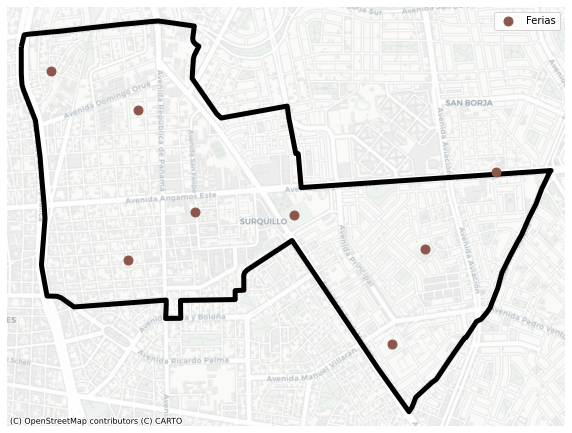

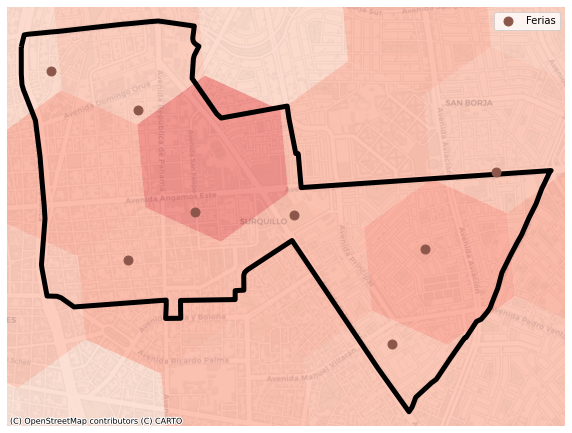

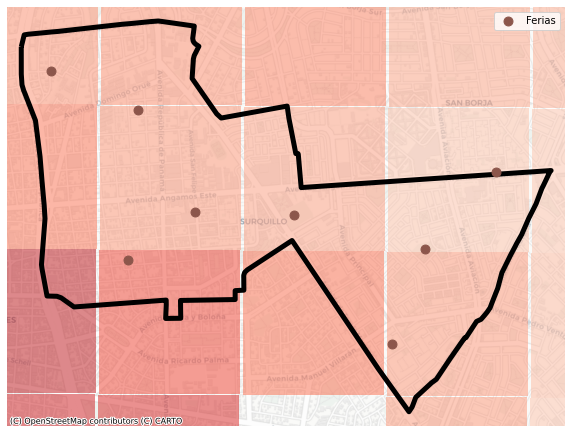

In [52]:
# 1. Ferias (puntos)
gen_map(ferias_gdf_proj, label='Ferias', fn='Ferias', clip=surquillo_proj,
        color=colors['ferias'], markersize=80)
# 2. Ferias (puntos) + Pob. Estimada
gen_map(ferias_gdf_proj, label='Ferias', fn='Ferias_pob_est', clip=surquillo_proj,
        pop_overlay=pop_est_overlay_web,  color=colors['ferias'], markersize=80)
# 3. Ferias (puntos) + Pob. Flotante
gen_map(ferias_gdf_proj, label='Ferias', fn='Ferias_pob_flot', clip=surquillo_proj,
        pop_overlay=pop_overlay_web, color=colors['ferias'], markersize=80)

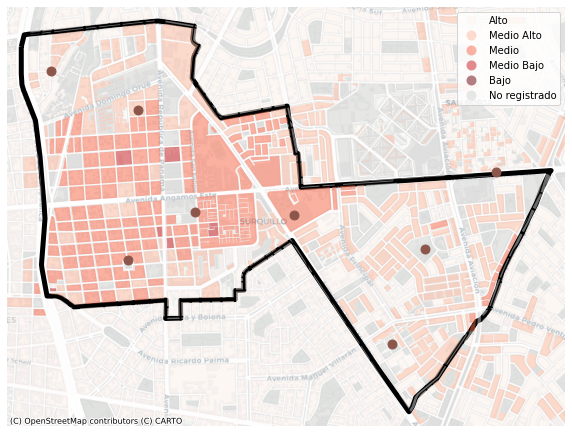

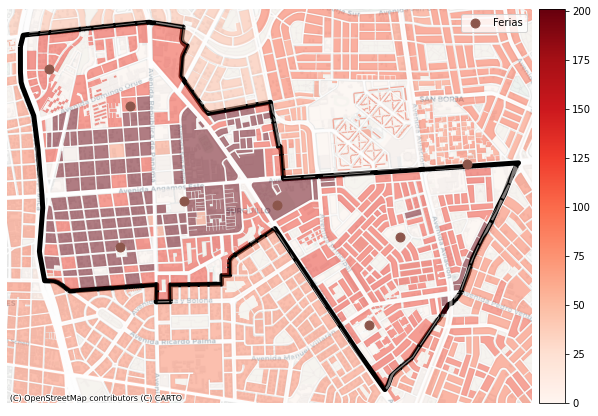

In [53]:
# 4. Ferias (puntos) + NSE Censo 2017
ax = gen_map(ferias_gdf_proj, 'Ferias', clip=surquillo_proj, return_ax=True,
             color=colors['ferias'], markersize=80)
manzanas_proj.plot(column='NSE16', alpha=0.5, cmap='Reds', 
                   legend=True, ax=ax,
                   missing_kwds={'color': 'lightgrey', 
                                 'label': 'No registrado'},
                   categories=['Alto', 'Medio Alto', 'Medio',
                               'Medio Bajo', 'Bajo'])
plt.savefig(f'outputs/maps/ferias_nse.png', dpi=300, bbox_inches='tight')
# 5. Ferias (puntos) + Densidad Pob Censo 2017
ax = gen_map(ferias_gdf_proj, 'Ferias', clip=surquillo_proj, return_ax=True,
             color=colors['ferias'], markersize=80)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

manzanas_proj.plot(column='POB16', alpha=0.5, cmap='Reds', 
                   legend=True, cax=cax, ax=ax,
                   missing_kwds={'color': 'lightgrey', 
                                 'label': 'No registrado'})
plt.savefig('outputs/maps/ferias_pob16.png', dpi=300, bbox_inches='tight')

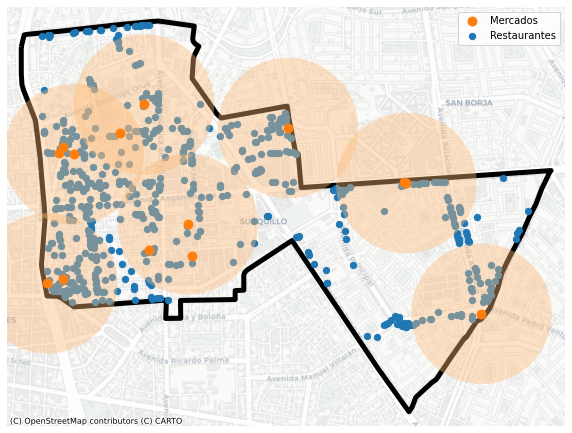

In [54]:
# 14. Mercados (puntos) + Restaurantes (puntos) + Entorno Restaurantes
ax = gen_map(mercados_gdf_proj, 'Mercados', clip=surquillo_proj, return_ax=True,
             create_buffers=True, buffer_centers=[1173, 1177, 1180, 1162, 1170, 1171, 1182],
             buffers_color=cmap_colors[3], color=colors['mercados'], markersize=80)
restaurants_proj.plot(ax=ax, label='Restaurantes', color=colors['restaurantes'], markersize=40)
plt.legend()

plt.savefig(f'outputs/maps/restaurantes_mercados_entornos.png', dpi=300, bbox_inches='tight')
plt.show()

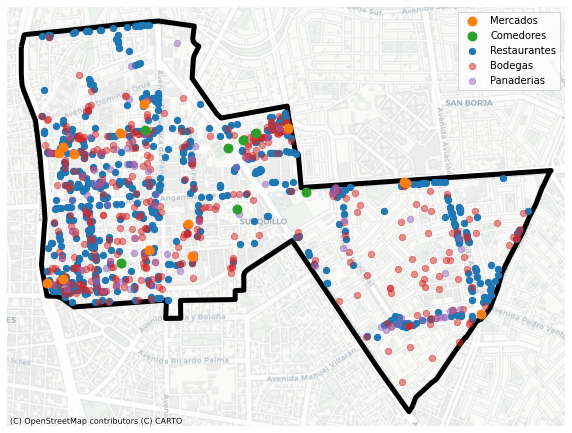

In [55]:
# 14. Mapa de mercados, restaurantes, comedores, bodegas y panaderias
ax = gen_map(mercados_gdf_proj, 'Mercados', clip=surquillo_proj, return_ax=True,
             color=colors['mercados'], markersize=80,) # zorder=3
comedores_gdf_proj.plot(ax=ax, label='Comedores', color=colors['comedores'], 
                        markersize=80, zorder=2)
restaurants_proj.plot(ax=ax, label='Restaurantes', color=colors['restaurantes'], 
                      markersize=40, zorder=1)
bodegas_gdf_proj.plot(ax=ax, label='Bodegas', color=colors['bodegas'], 
                      markersize=40, zorder=1, alpha=0.5)
panaderias_proj.plot(ax=ax, label='Panaderias', color=colors['panaderias'], 
                     markersize=40, zorder=1, alpha=0.5)
plt.legend()

plt.savefig(f'outputs/maps/merc+rest+come+bode+panad.png', dpi=300, bbox_inches='tight')
plt.show()

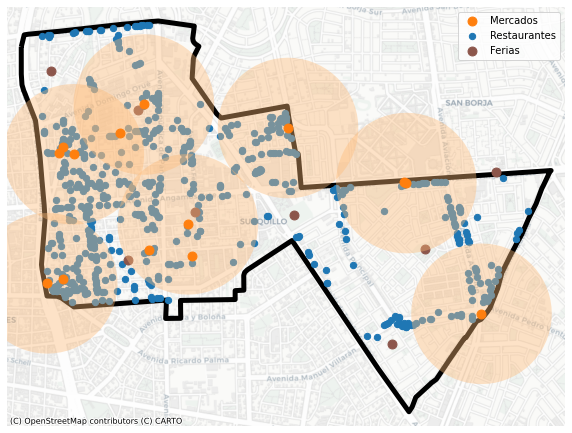

In [56]:
# 14. Mercados (puntos) + Restaurantes (puntos) + Ferias + Entorno Restaurantes
ax = gen_map(mercados_gdf_proj, 'Mercados', clip=surquillo_proj, return_ax=True,
             create_buffers=True, buffer_centers=[1173, 1177, 1180, 1162, 1170, 1171, 1182],
             buffers_color=cmap_colors[3], color=colors['mercados'], markersize=80)
restaurants_proj.plot(ax=ax, label='Restaurantes', color=colors['restaurantes'], markersize=40)
ferias_gdf_proj.plot(ax=ax, label='Ferias', color=colors['ferias'], markersize=80)
plt.legend()

plt.savefig(f'outputs/maps/restaurantes_mercados_ferias_entornos.png', dpi=300, bbox_inches='tight')
plt.show()

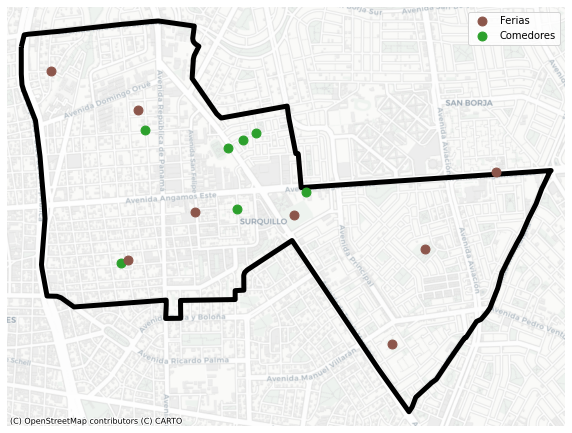

In [57]:
# Mapa de ferias y comedores
ax = gen_map(ferias_gdf_proj, 'Ferias', clip=surquillo_proj, return_ax=True,
             color=colors['ferias'], markersize=80,) # zorder=3
comedores_gdf_proj.plot(ax=ax, label='Comedores', color=colors['comedores'], 
                        markersize=80, zorder=2)
plt.legend()

plt.savefig(f'outputs/maps/ferias_comedores.png', dpi=300, bbox_inches='tight')
plt.show()

In [58]:
# Mapa de calor PoIs (mercados, restaurantes, comedores, bodegas y panaderias)
pois = pd.concat([
    mercados_gdf.geometry,
    comedores_gdf.geometry,
    restaurants.geometry,
    bodegas_gdf.to_crs(epsg=4326).geometry,
    panaderias.geometry,])

fig, ax = plt.subplots(1, 1, figsize=(10,10))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

geoplot.kdeplot(pois, ax=ax, cbar=True,
    shade=True, cmap='Reds', alpha=0.5, shade_lowest=False, cbar_ax=cax)

surquillo.plot(ax=ax, facecolor="none", edgecolor='k', linewidth=5)

ax.set_title('Concentración de Oferta Alimentaria')

ctx.add_basemap(ax, source=BASEMAP_SRC, crs='EPSG:4326')
ax.set_axis_off()

plt.savefig('outputs/maps/pois-heatmap.png', dpi=300, bbox_inches='tight')

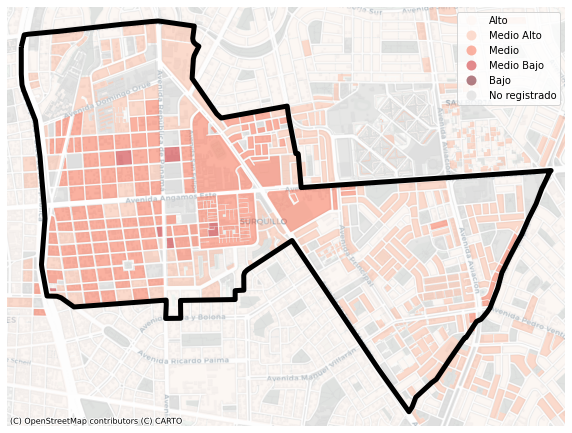

In [76]:
ax = manzanas_proj.plot(figsize=(10,10), column='NSE16', alpha=0.5, 
                        cmap='Reds', legend=True, 
                        missing_kwds={'color': 'lightgrey', 
                                      'label': 'No registrado'}, 
                        categories=['Alto', 'Medio Alto', 'Medio', 
                                    'Medio Bajo', 'Bajo'])
border = 100
surquillo_proj.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=5, zorder=1)
minx, miny, maxx, maxy = surquillo_proj.total_bounds
ax.set_xlim(minx - border, maxx + border)
ax.set_ylim(miny - border, maxy + border)
ctx.add_basemap(ax, source=BASEMAP_SRC)
ax.set_axis_off()
plt.savefig(f'outputs/maps/nse.png', dpi=300, bbox_inches='tight')

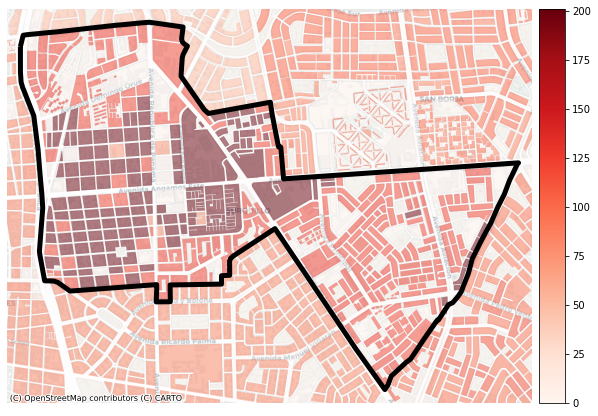

In [77]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

manzanas_proj.plot(ax=ax, column='POB16', alpha=0.5, cmap='Reds', legend=True, missing_kwds={'color': 'lightgrey', 'label': 'No registrado'},  cax=cax)
border = 100
surquillo_proj.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=5, zorder=1)
minx, miny, maxx, maxy = surquillo_proj.total_bounds
ax.set_xlim(minx - border, maxx + border)
ax.set_ylim(miny - border, maxy + border)
ctx.add_basemap(ax, source=BASEMAP_SRC)
ax.set_axis_off()
plt.savefig('outputs/maps/pob16manzanas.png', dpi=300, bbox_inches='tight')

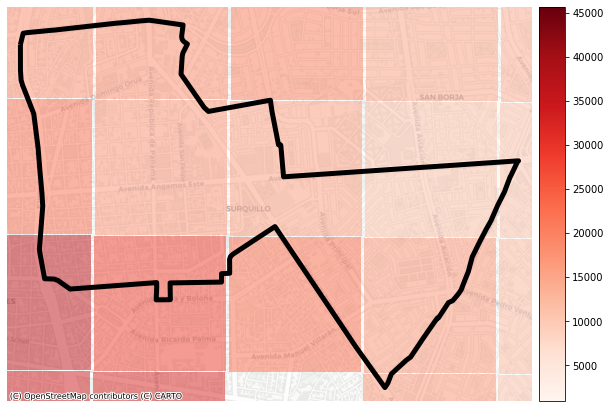

In [71]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

pop_overlay_web.plot(column='population', cmap='Reds', edgecolor='none', 
                     alpha=0.5, legend=True, zorder=1, ax=ax, cax=cax, )

border = 100
surquillo_proj.plot(ax=ax, facecolor='none', edgecolor='k',
          linewidth=5, zorder=1)
minx, miny, maxx, maxy = surquillo_proj.total_bounds
ax.set_xlim(minx - border, maxx + border)
ax.set_ylim(miny - border, maxy + border)
        
ctx.add_basemap(ax, source=BASEMAP_SRC)
ax.set_axis_off()

plt.savefig(f'outputs/maps/pob_flot.png', dpi=300, bbox_inches='tight')

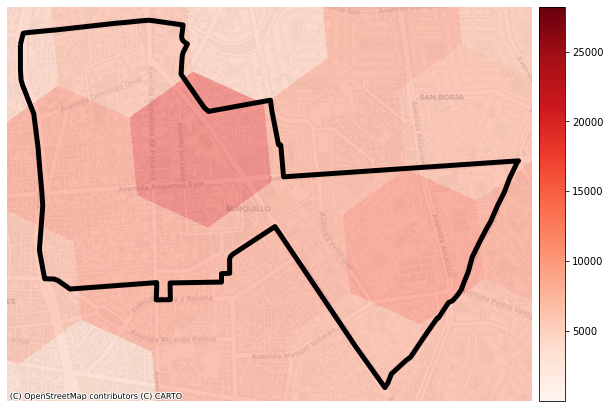

In [72]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

pop_est_overlay_web.plot(column='population', cmap='Reds', edgecolor='none', 
                     alpha=0.5, legend=True, zorder=1, ax=ax, cax=cax, )

border = 100
surquillo_proj.plot(ax=ax, facecolor='none', edgecolor='k',
          linewidth=5, zorder=1)
minx, miny, maxx, maxy = surquillo_proj.total_bounds
ax.set_xlim(minx - border, maxx + border)
ax.set_ylim(miny - border, maxy + border)
        
ctx.add_basemap(ax, source=BASEMAP_SRC)
ax.set_axis_off()

plt.savefig(f'outputs/maps/pob_est_2020.png', dpi=300, bbox_inches='tight')

In [78]:
# fig, ax = plt.subplots(1, 1, figsize=(10,10))
# divider = make_axes_locatable(ax)
# cax = divider.append_axes("right", size="5%", pad=0.1)

# hexs_surquillo_webm.plot(ax=ax, column='POB16', alpha=0.75, cmap='Reds', legend=True,  cax=cax)
# border = 100
# surquillo.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=5, zorder=1)

# # ax.set_xlim(minx - border, maxx + border)
# # ax.set_ylim(miny - border, maxy + border)
# ctx.add_basemap(ax, source=BASEMAP_SRC)
# ax.set_axis_off()
# plt.savefig(f'outputs/maps/pob16.png', dpi=300, bbox_inches='tight')